In [1]:
include("../MathModule.jl")
using Main.MathModule
include("../GeometryModule.jl")
using Main.GeometryModule
include("../SourceModule.jl")
using Main.SourceModule
include("../MaterialModule.jl")
using Main.MaterialModule
include("../ObjectModule.jl")
using Main.ObjectModule
include("../DetectorModule.jl")
using Main.DetectorModule
include("../IllustrationModule.jl")
using Main.IllustrationModule

include("../RayTrace.jl")
using .RayTrace

using PlotlyJS


In [11]:
deg = π/180.0
lx = 2000.0
ly = 2000.0
tt = 500.0
h_cone = 200.0
r_cone = 10.0
θ_cone = 30.0*deg
r_cele = 4000.0
geo_box = make_box(lx, ly, tt-h_cone, [0.0, 0.0, (tt-h_cone)/2.0])
geo_cone = make_cone(r_cone, r_cone+h_cone*tan(θ_cone), h_cone, [0.0, 0.0, tt-h_cone])

rectbox = Object(
    geo_box, 
    diamond_ib_mild
)

uconcent = Object(
    geo_cone, 
    diamond_ib_mild
)



num_sx = 100 # number of points along x
num_sy = 100 # number of points along y
num_sn = 10 # number of surface normals
traces_objects = PlotlyJS.GenericTrace[]
traces_box = draw_volume(geo_box, num_sx, num_sy, num_sn; color_sf="rgba(241, 248, 108, 0.3)", display=false);
traces_cone = draw_volume(geo_cone, num_sx, num_sy, num_sn; color_sf="rgba(241, 248, 108, 0.3)", display=false);

append!(traces_objects, traces_box);
append!(traces_objects, traces_cone);

In [18]:
nv_depth = 0.5
center_ps = [0.0, 0.0, tt - nv_depth]
psource = PointSource(
    Frame(center_ps, rm_eye),
    0.680, #[um]
    1.0, 
    isotropic_distribution()
)

geo_sphere = make_sphere(r_cele, center_ps)
fakecelestial = Object(
    geo_sphere, 
    air
)

num_sx = 100 # number of points along x
num_sy = 100 # number of points along y
num_sn = 0 # number of surface normals
traces_sphere = draw_volume(geo_sphere, num_sx, num_sy, num_sn; color_sf="rgba(160, 180, 160, 0.05)", display=false);
append!(traces_objects, traces_sphere);

In [19]:
size_bundle = 10
raybundle = emit_rays(psource, size_bundle)
objects = [rectbox, uconcent, fakecelestial]
threshold = 0.01

0.01

In [20]:
trajectories = Trajectory[]
# Threads.@threads for ray in raybundle
for ray in raybundle
    tjroot = TrajectoryNode(ray, [])
    trajectory = Trajectory(tjroot)
    amp_terminate = threshold*ray.amplitude
    # put the generate rays go back to this step
    # say define a function call propate_ray!
    hitrecord_shortest = Vector{Union{Nothing, HitRecord}}(nothing, 2)
    propagate_ray!(objects, ray, hitrecord_shortest, tjroot, 0;t_min=1e-6, t_max=1e6, amp_terminate=amp_terminate)
    push!(trajectories, trajectory)
end

In [21]:
traces_trajectories = GenericTrace[]
for tj in trajectories
    trace_tj = draw_trajectory(tj; color="rgba(255,0,0,1)", sizemode="fixed", draw_cone=false, display=false)
    append!(traces_trajectories, trace_tj)
end
layout = PlotlyJS.Layout(
title="Ray Trajectories",
width=800,   # Set width in pixels
height=600,  # Set height in pixels
scene=attr(
    xaxis=attr(visible=false, showgrid=false, zeroline=false),
    yaxis=attr(visible=false, showgrid=false, zeroline=false),
    zaxis=attr(visible=false, showgrid=false, zeroline=false),
    bgcolor="rgba(255,255,255,1)", 
    aspectmode="data"
),
paper_bgcolor="rgba(255,255,255,1)", 
showlegend=false
)

# Display the plot
fig = PlotlyJS.plot(vcat(traces_objects, traces_trajectories), layout);

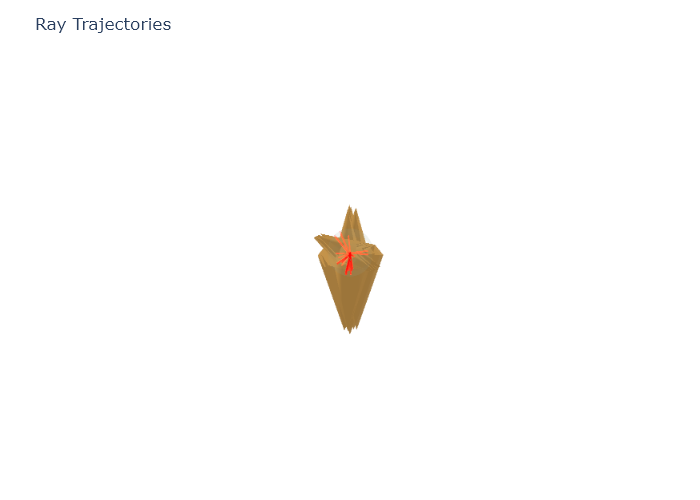

In [22]:
PlotlyJS.display(fig)